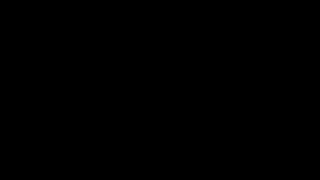

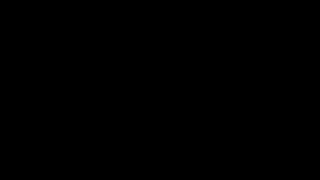

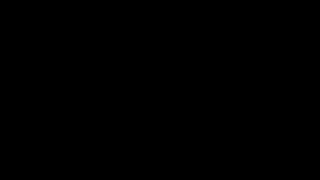

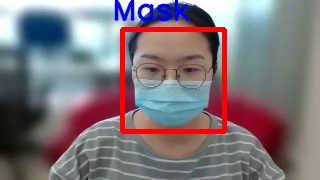

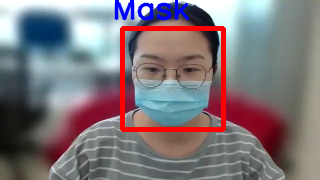

...

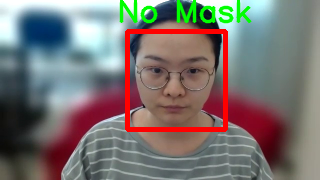

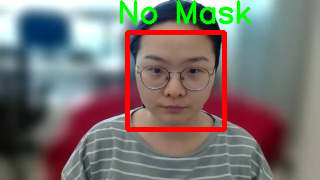

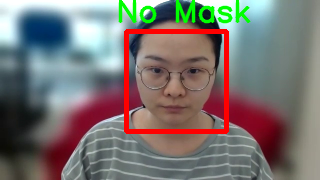

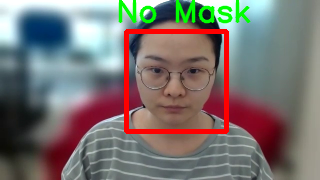

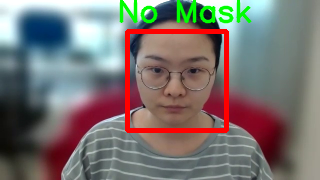

In [ ]:
import cv2
from tensorflow.keras.models import load_model
from keras.preprocessing.image import load_img , img_to_array
import numpy as np
from google.colab.patches import cv2_imshow
model =load_model('/content/model.h5')

img_width , img_height = 150,150

face_cascade = cv2.CascadeClassifier('/content/haarcascade_frontalface_default.xml')

cap = cv2.VideoCapture('/content/video.mp4')

img_count_full = 0

font = cv2.FONT_HERSHEY_SIMPLEX
org = (1,1)
class_label = ''
fontScale = 1
color = (255,0,0)
thickness = 2

while True:
	img_count_full += 1
	response , color_img = cap.read()

	if response == False:
		break


	scale = 50
	width = int(color_img.shape[1]*scale /100)
	height = int(color_img.shape[0]*scale/100)
	dim = (width,height)

	color_img = cv2.resize(color_img, dim ,interpolation= cv2.INTER_AREA)

	gray_img = cv2.cvtColor(color_img,cv2.COLOR_BGR2GRAY)

	faces = face_cascade.detectMultiScale(gray_img, 1.1, 6)

	img_count = 0
	for (x,y,w,h) in faces:
		org = (x-10,y-10)
		img_count += 1
		color_face = color_img[y:y+h,x:x+w]
		cv2.imwrite('/var/%d%dface.jpg'%(img_count_full,img_count),color_face)
		img = load_img('/var/%d%dface.jpg'%(img_count_full,img_count),target_size=(img_width,img_height))
		img = img_to_array(img)
		img = np.expand_dims(img,axis=0)
		prediction = model.predict(img)


		if prediction==0:
			class_label = "Mask"
			color = (255,0,0)

		else:
			class_label = "No Mask"
			color = (0,255,0)


		cv2.rectangle(color_img,(x,y),(x+w,y+h),(0,0,255),3)
		cv2.putText(color_img, class_label, org, font ,fontScale, color, thickness,cv2.LINE_AA)

	cv2_imshow( color_img)
	if cv2.waitKey(1) & 0xFF == ord('q'):
		break

cap.release()
cv2.destroyAllWindows()

